In [1]:
%matplotlib inline
from utils import utils
import canny_edge_detector as ced
import numpy as np
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
from myfuncs import funcs
import cv2 as cv

In [2]:
dir_name = "Images/Inputs/Set1"
imgs = utils.load_data(dir_name)

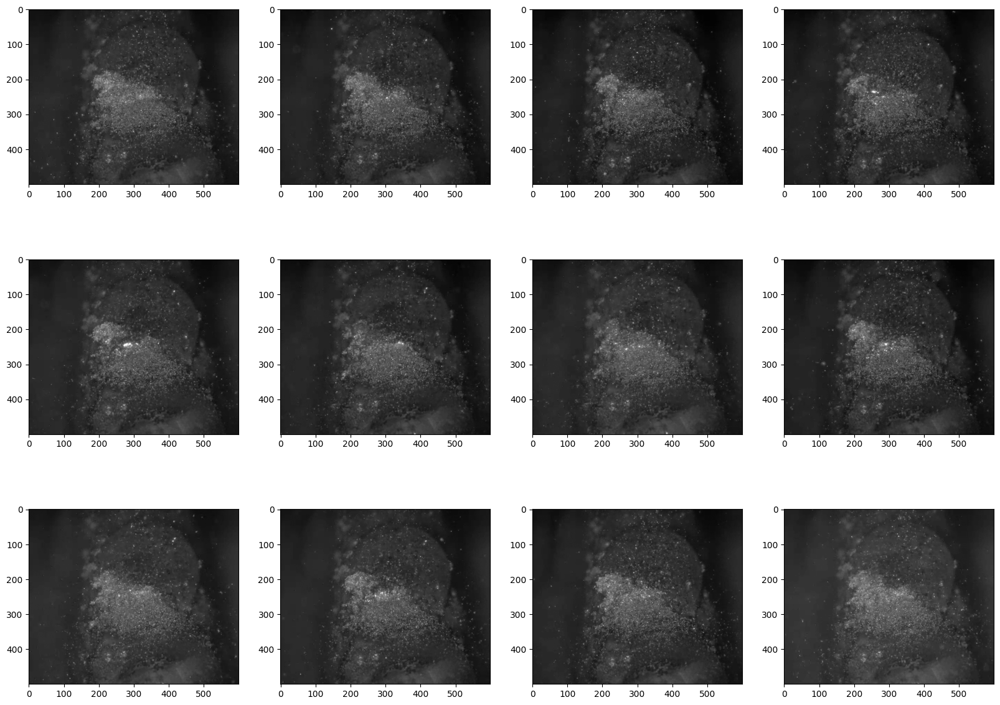

In [3]:
utils.visualize(imgs, "gray")

In [4]:
#detector = ced.cannyEdgeDetector(imgs, sigma=3, kernel_size=9, lowthreshold=0.05, highthreshold=0.22, weak_pixel=200)
#imgs_final = detector.detect()
#utils.visualize(imgs_final, 'gray')

In [4]:
detector = ced.cannyEdgeDetector(imgs, sigma=10, kernel_size=72, lowthreshold=0.08, highthreshold=0.20, weak_pixel=50)

In [5]:
imgs_final = detector.detect()

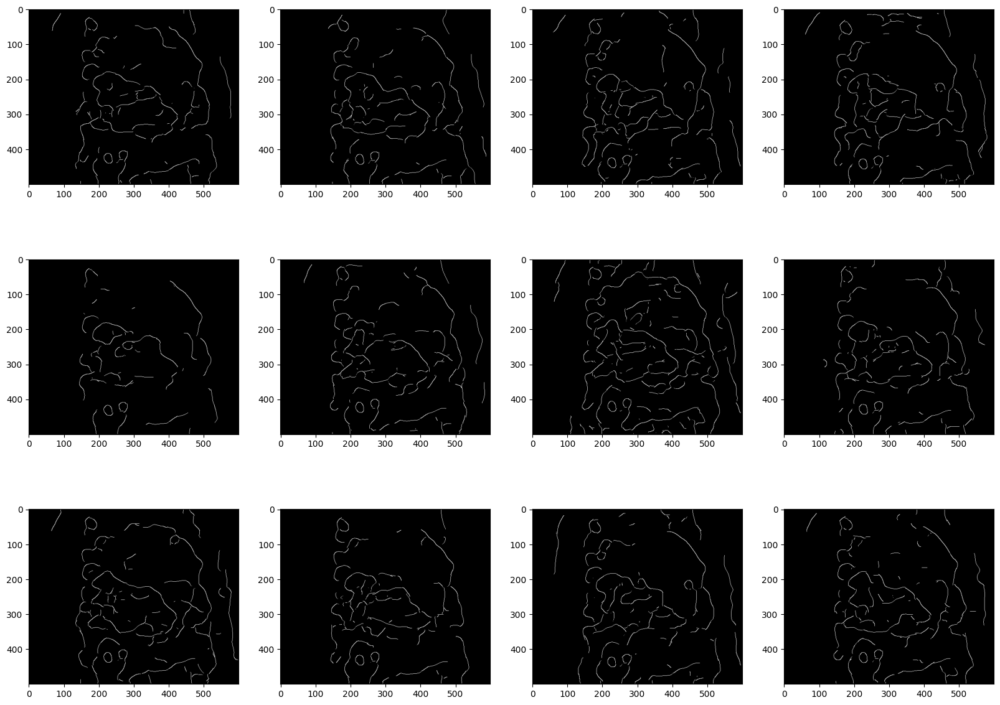

In [6]:
utils.visualize(imgs_final, 'gray')

In [7]:
im_test = Image.open("Images/Inputs/Set2/20240816-161944712534-0014.png")

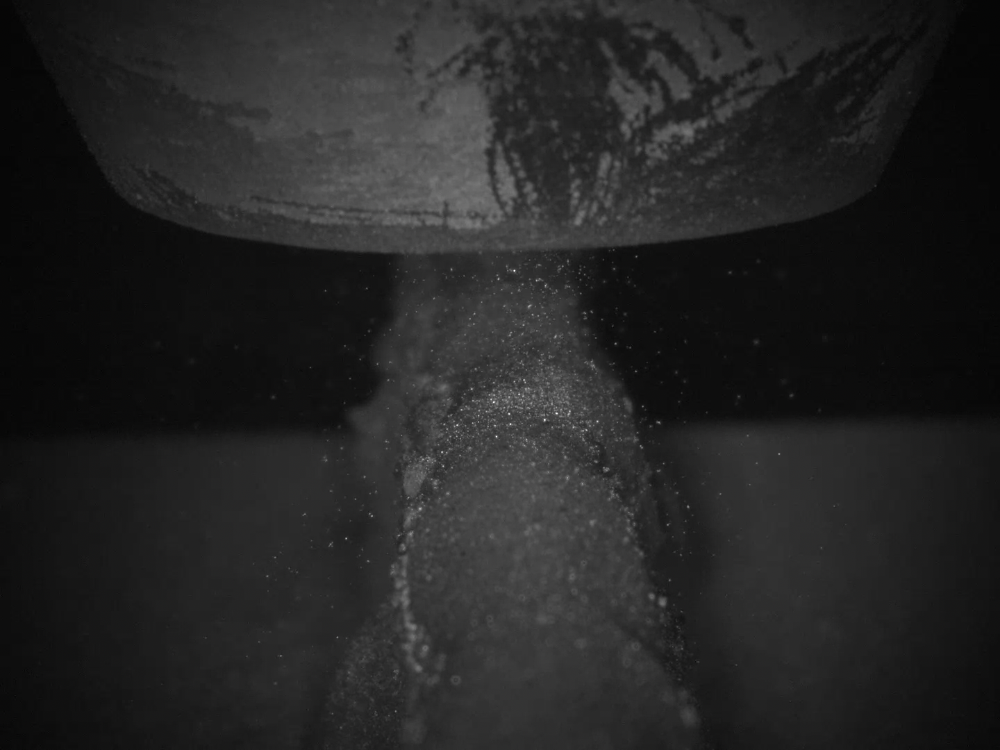

In [8]:
display(im_test)

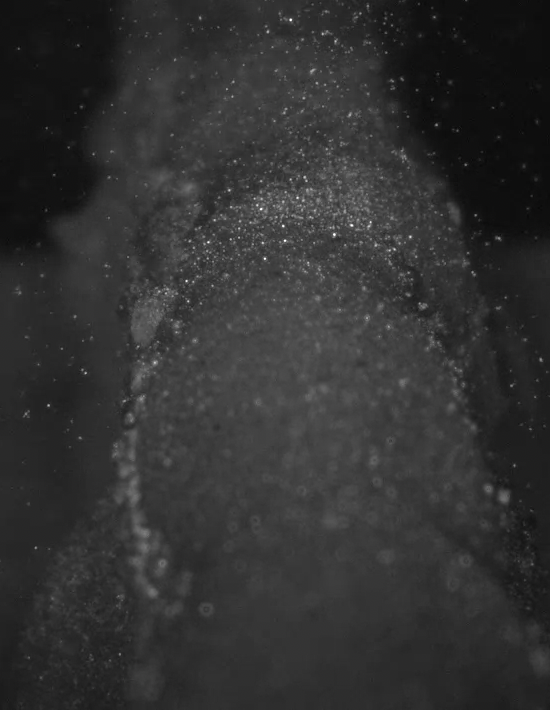

In [9]:
im_crop = im_test.crop((450,370,1000,1080)) #image was 1920x1080
display(im_crop)

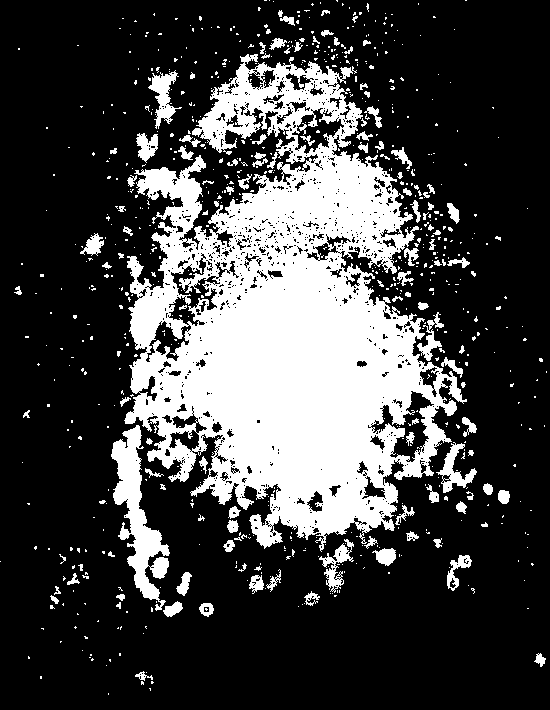

In [10]:
im_grey = im_crop.convert('L')
threshold = 60
im_thresh = im_grey.point(lambda p : 255 if p > threshold else 0)
display(im_thresh)

## Using OpenCV for video

In [12]:
vid = cv.VideoCapture('Vids/VID_topview.webm')
fourcc = cv.VideoWriter_fourcc(*'MP4V')
out = cv.VideoWriter('output.mp4', fourcc, 30.0, (int(vid.get(3)), int(vid.get(4))), isColor=False)

if (vid.isOpened() == False):
    print("Error opening video stream or file")

while (vid.isOpened()):
    (ret, frame) = vid.read()
    if ret == True:
        #cv.imshow('Frame', frame)
        frame = cv.GaussianBlur(frame, (15, 15), 5)
        frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
        edge = cv.Canny(frame, 8, 14)

        out.write(edge)
        cv.imshow('Edge Detection', edge)

    else:
        break


    if cv.waitKey(25) & 0xFF == ord('q'):
        break


vid.release()
out.release()

cv.waitKey(1)
cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


In [52]:
total_frames = vid.get(cv.CAP_PROP_FRAME_)
total_frames

0.0

## Finetuning Canny with OpenCV

Reading images an cropping to ROI

In [17]:
im1 = cv.imread('Images/Inputs/topview/VID_topview-0001.png', cv.IMREAD_GRAYSCALE)
im2 = cv.imread('Images/Inputs/topview/VID_topview-0002.png', cv.IMREAD_GRAYSCALE)
im3 = cv.imread('Images/Inputs/topview/VID_topview-0003.png', cv.IMREAD_GRAYSCALE)
roi1 = im1[250:850, 420:1020]
roi2 = im2[250:850, 420:1020]

Normalizing images

In [18]:
roi1_norm = cv.normalize(roi1, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)
roi2_norm = cv.normalize(roi2, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)

Equalizing images

In [19]:
equ1 = cv.equalizeHist(roi1_norm)
equ2 = cv.equalizeHist(roi2_norm)

Creating histograms to analyse images

In [5]:
hist1 = cv.calcHist([roi1], [0], None, [256], [0, 256]) # image 1
hist2 = cv.calcHist([roi2], [0], None, [256], [0, 256]) # image 2
hist3 = cv.calcHist([roi1_norm], [0], None, [256], [0, 256]) # normed image 1
hist4 = cv.calcHist([roi2_norm], [0], None, [256], [0, 256]) # normed image 2
hist5 = cv.calcHist([equ1], [0], None, [256], [0, 256]) # equalized image 1
hist6 = cv.calcHist([equ2], [0], None, [256], [0, 256]) # equalized image 2

Plotting

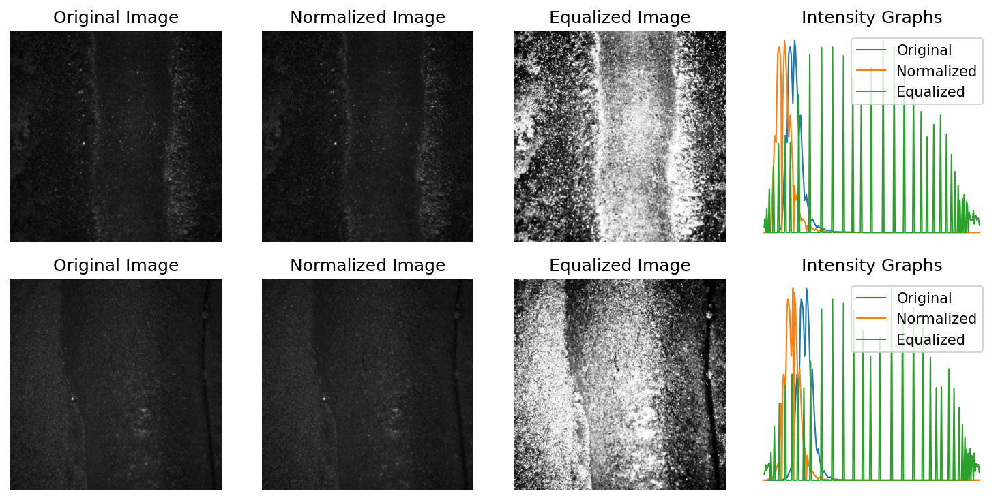

In [8]:
fig, axs = plt.subplots(2, 4, dpi=150, figsize=(10,5), layout='tight')

# turn off axes
for i in range(2):
    for j in range(4):
        axs[i, j].set_axis_off()

lw=1 # linewidth for line plots

axs[0, 0].set_title('Original Image')
axs[0, 0].imshow(roi1, cmap='grey')
axs[0, 1].set_title('Normalized Image')
axs[0, 1].imshow(roi1_norm, cmap='grey')
axs[0, 2].set_title('Equalized Image')
axs[0, 2].imshow(equ1, cmap='grey')
axs[0, 3].set_title('Intensity Graphs')
axs[0, 3].plot(hist1, label='Original', lw=lw)
axs[0, 3].plot(hist3, label='Normalized', lw=lw)
axs[0, 3].plot(hist5, label='Equalized', lw=lw)
axs[0, 3].legend(loc='upper right')

axs[1, 0].set_title('Original Image')
axs[1, 0].imshow(roi2, cmap='grey')
axs[1, 1].set_title('Normalized Image')
axs[1, 1].imshow(roi2_norm, cmap='grey')
axs[1, 2].set_title('Equalized Image')
axs[1, 2].imshow(equ2, cmap='grey')
axs[1, 3].set_title('Intensity Graphs')
axs[1, 3].plot(hist2, label='Original', lw=lw)
axs[1, 3].plot(hist4, label='Normalized', lw=lw)
axs[1, 3].plot(hist6, label='Equalized', lw=lw)
axs[1, 3].legend(loc='upper right')

fig.tight_layout()

Now we can look for optimized canny parameters

Creating a combined canny function

In [4]:
def cv_Canny(img, sigma, kernel_size, low_thresh, hi_thresh):
    img_blur = cv.GaussianBlur(img, dst=None, ksize=(kernel_size, kernel_size), sigmaX=sigma)
    img_canny = cv.Canny(img_blur, low_thresh, hi_thresh)
    return img_canny

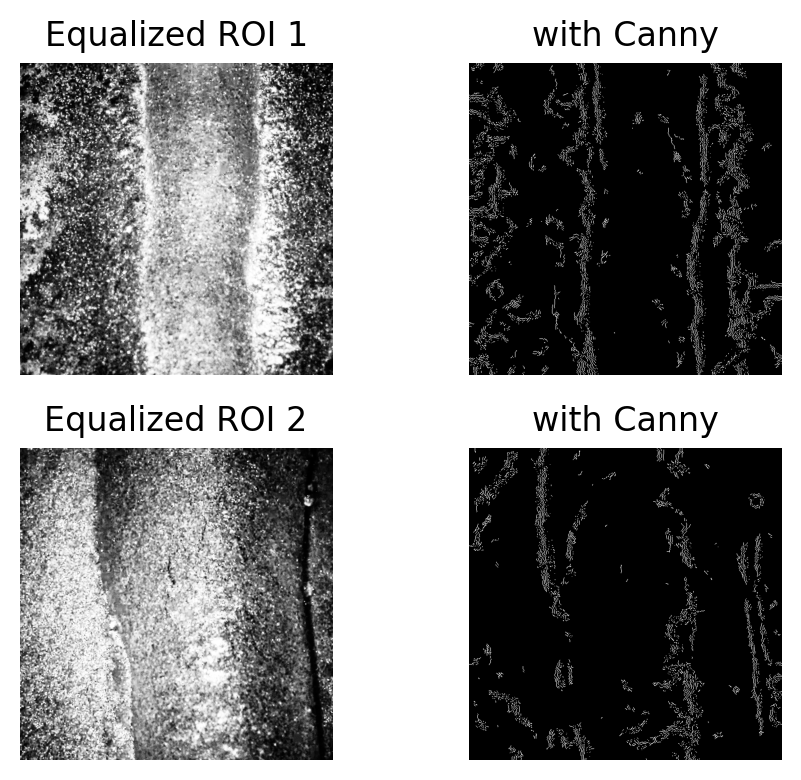

In [10]:
sig = 10
kern = 71
lo_th = 15 
hi_th = 20 # 20

equ1_canny = cv_Canny(equ1, sigma=sig, kernel_size=kern, low_thresh=lo_th, hi_thresh=hi_th)
equ2_canny = cv_Canny(equ2, sigma=sig, kernel_size=kern, low_thresh=lo_th, hi_thresh=hi_th)

images = [equ1, equ1_canny, equ2, equ2_canny]
titles = ['Equalized ROI 1', 'with Canny', 'Equalized ROI 2', 'with Canny']

fig, ax = plt.subplots(2,2, dpi=200, figsize=(5,4))

for i, this_ax in enumerate(ax.flatten()):
    this_ax.set_axis_off()
    this_ax.imshow(images[i], cmap='grey')
    this_ax.set_title(titles[i])

fig.tight_layout()

### A Canny Parameter selection tool

In [13]:
test_image = roi1_norm # feed only grayscale images!
window_name = 'Canny Tester'
trackbar_sigma = 'Sigma'
max_sigma = 100
trackbar_kernel = ' Kernel Size'
max_kernel = 201
trackbar_lo_thresh = 'Low'
trackbar_hi_thresh = 'High'
max_value = 255
trackbar_thresh = 'Thresh'

def Canny_Demo(val):

    sigma = cv.getTrackbarPos(trackbar_sigma, window_name)
    kernel = cv.getTrackbarPos(trackbar_kernel, window_name)
    kernel = (int(kernel/2)*2)+1 # ensures kernel is always odd
    lo = cv.getTrackbarPos(trackbar_lo_thresh, window_name)
    hi = cv.getTrackbarPos(trackbar_hi_thresh, window_name)
    thresh_val = cv.getTrackbarPos(trackbar_thresh, window_name)
    _, thresh = cv.threshold(test_image, thresh_val, 255, cv.THRESH_TOZERO)
    blur = cv.GaussianBlur(thresh, (kernel, kernel), sigma)
    canny = cv.Canny(blur, lo, hi)
    cv.imshow(window_name, canny)

cv.namedWindow(window_name)

cv.createTrackbar(trackbar_sigma, window_name, 6, max_sigma, Canny_Demo )
cv.createTrackbar(trackbar_kernel, window_name , 33, max_kernel, Canny_Demo)
cv.createTrackbar(trackbar_lo_thresh, window_name , 7, max_value, Canny_Demo)
cv.createTrackbar(trackbar_hi_thresh, window_name , 7, max_value, Canny_Demo)
cv.createTrackbar(trackbar_thresh, window_name , 40, max_value, Canny_Demo)

# Call the function to initialize
Canny_Demo(0)
# Wait until user finishes program
cv.waitKey()

cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

Optimized parameters found as:

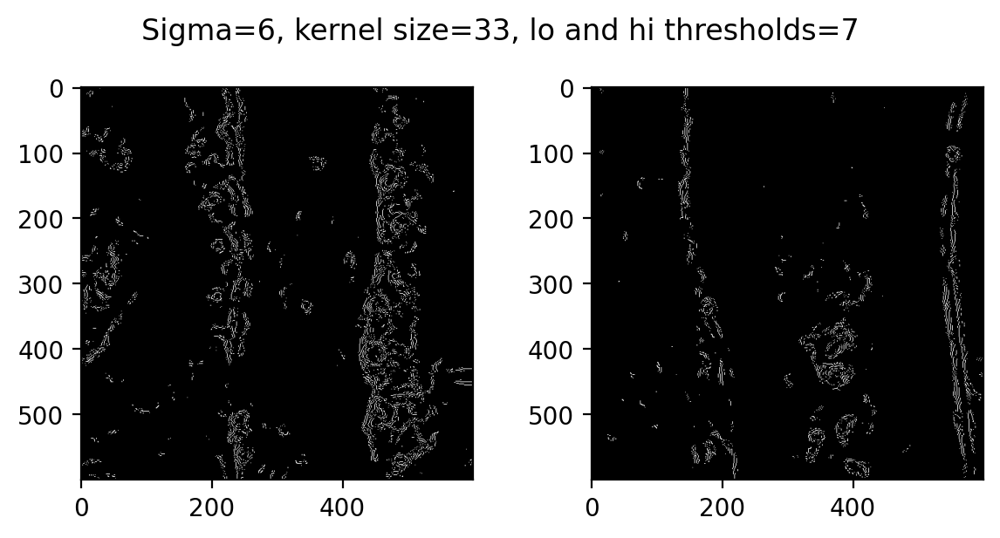

In [32]:
fig, axs = plt.subplots(1,2, figsize=(6,3), dpi=200)
fig.suptitle('Sigma=6, kernel size=33, lo and hi thresholds=7')
axs[0].imshow(cv_Canny(roi1_norm, 6, 33, 7, 7), cmap='grey')
axs[1].imshow(cv_Canny(roi2_norm, 6, 33, 7, 7), cmap='grey')
fig.tight_layout()

Now we subtract a threshold of 60 from the above to reduce the effect of reflection

In [70]:
def threshold_subtraction(src, thresh=60):

    _, highlights = cv.threshold(src, thresh, 255, cv.THRESH_TOZERO)
    diff = cv.subtract(src, highlights)
    canny_orig = cv_Canny(src, 6, 33, 7, 7)
    canny_diff = cv_Canny(diff, 6, 33, 7, 7)
    plots = [src, highlights, diff, canny_orig, canny_diff]
    titles = ['Original', 'Highlights', 'Difference', 'OG Canny', 'New Canny']

    fig, axs = plt.subplots(1,5, figsize=(15,4))
    for i, ax in enumerate(axs.flatten()):
        ax.imshow(plots[i], cmap='grey')
        ax.set_title(titles[i])
        ax.set_axis_off()

    return canny_diff

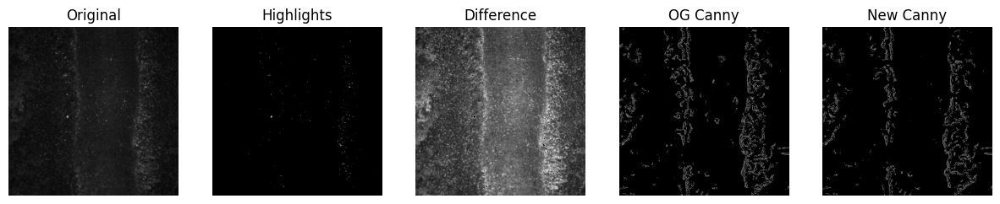

In [15]:
roi1_norm_diff = threshold_subtraction(roi1_norm, 75)

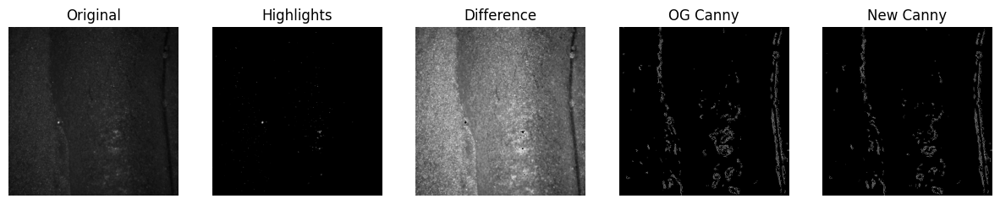

In [71]:
roi2_norm_diff = threshold_subtraction(roi2_norm, 75)

In [14]:
vid = cv.VideoCapture('Vids/VID_topview.webm')
fourcc = cv.VideoWriter_fourcc(*'MP4V')
out = cv.VideoWriter('output2.mp4', fourcc, 30.0, (int(vid.get(3)), int(vid.get(4))), isColor=False)

if (vid.isOpened() == False):
    print("Error opening video stream or file")

kern = 33
sig = 6
lo_th = 7
hi_th = 7

while (vid.isOpened()):
    (ret, frame) = vid.read()
    if ret == True:
        #cv.imshow('Frame', frame) # show opened frame
        frame = frame[250:850, 420:1020] # crop
        frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
        frame = cv.normalize(frame, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)
        #frame = cv.equalizeHist(frame)
        frame = cv.GaussianBlur(frame, (kern, kern), sig)
        edge = cv.Canny(frame, lo_th, hi_th)
        
        out.write(edge)
        cv.imshow('Edge Detection', edge)

    else:
        break


    if cv.waitKey(25) & 0xFF == ord('q'):
        break


vid.release()
out.release()


cv.waitKey()

cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


## Statistical analysis for images

First we play around with thresholding to see what works for our image

In [6]:

max_value = 255
max_type = 4
max_binary_value = 255
trackbar_type = 'Type: \n 0: Binary \n 1: Binary Inverted \n 2: Truncate \n 3: To Zero \n 4: To Zero Inverted'
trackbar_value = 'Value'
window_name = 'Threshold Demo'
def Threshold_Demo(val):
    #0: Binary
    #1: Binary Inverted
    #2: Threshold Truncated
    #3: Threshold to Zero
    #4: Threshold to Zero Inverted
    threshold_type = cv.getTrackbarPos(trackbar_type, window_name)
    threshold_value = cv.getTrackbarPos(trackbar_value, window_name)
    _, dst = cv.threshold(src, threshold_value, max_binary_value, threshold_type )
    cv.imshow(window_name, dst)

src = roi1_norm

cv.namedWindow(window_name)
cv.createTrackbar(trackbar_type, window_name , 3, max_type, Threshold_Demo)
cv.createTrackbar(trackbar_value, window_name , 0, max_value, Threshold_Demo)
# Call the function to initialize
Threshold_Demo(0)
# Wait until user finishes program
cv.waitKey()

cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

From the above we find that around 50 is a good value to truncate the normalized ROIs to

In [20]:
# Cannified Images:
im1_canny = cv_Canny(roi1_norm, 6, 33, 7, 7)
im2_canny = cv_Canny(roi2_norm, 6, 33, 7, 7)

### Image 1

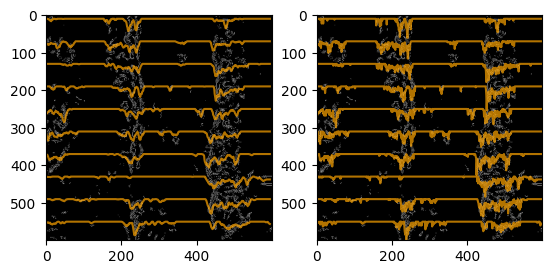

In [11]:
row_width = 60
row_starts = np.arange(0, im1_canny.shape[1], row_width)
col_sum_filtered_list = []

for row_start in row_starts:
    rows = im1_canny[row_start: row_start+row_width] # select rows
    col_sum = rows.sum(axis=0)/100
    
    # Define the window size for the SMA filter#+
    window_size = 5
    # Apply the SMA filter to row_starts
    col_sum_filtered = np.convolve(col_sum, np.ones(window_size), 'valid') / window_size  
    col_sum_filtered_list.append(col_sum_filtered)
    
    plt.subplot(1,2,1) 
    plt.plot(col_sum_filtered + row_start+10, color='orange', alpha=0.7, lw=1.5)
    plt.subplot(1,2,2)
    plt.plot(col_sum + row_start+10, color='orange', alpha=0.7, lw=1.5)
    
# showing images
plt.subplot(1,2,1)
plt.imshow(im1_canny, cmap='gray')
plt.subplot(1,2,2)
plt.imshow(im1_canny, cmap='gray')


### Image 2

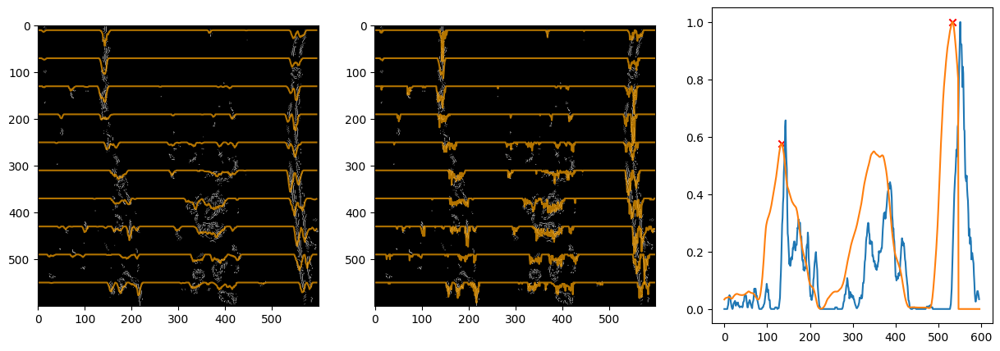

In [80]:
row_width = 60
row_starts = np.arange(0, im2_canny.shape[1], row_width)
col_sum_list = []
col_sum_filtered_list = []
convolution_list = []

plt.figure(figsize=(15,5))

for i, row_start in enumerate(row_starts):
    
    rows = im2_canny[row_start: row_start+row_width] # select rows
    col_sum = rows.sum(axis=0)/100
    col_sum_list.append(col_sum)
    # Define the window size for the SMA filter#+
    window_size = 5
    # Apply the SMA filter to row_starts
    col_sum_filtered = np.convolve(col_sum, np.ones(window_size), 'valid') / window_size  
    col_sum_filtered_list.append(col_sum_filtered)
    
    #plotting the signals
    plt.subplot(1,3,1) 
    plt.plot(col_sum_filtered + row_start+10, color='orange', alpha=0.7, lw=1.5)
    plt.subplot(1,3,2)
    plt.plot(col_sum + row_start+10, color='orange', alpha=0.7, lw=1.5)

# showing images
plt.subplot(1,3,1)
plt.imshow(im2_canny, cmap='gray')
plt.subplot(1,3,2)
plt.imshow(im2_canny, cmap='gray')

# showing total column sums
colsums_2 = np.sum(col_sum_filtered_list, axis=0)
plt.subplot(1,3,3)
plt.plot(colsums_2/(np.max(colsums_2)))
window_size=50
colsums_2_conv = np.convolve(colsums_2, np.ones(window_size), 'valid')
colsums_2_conv /= np.max(colsums_2_conv)
plt.plot(np.pad(colsums_2_conv, (0, window_size)))
colsums_2_max = funcs.peak_finder(colsums_2_conv, 2)
plt.scatter(colsums_2_max, colsums_2_conv[colsums_2_max], marker='x', color='red')

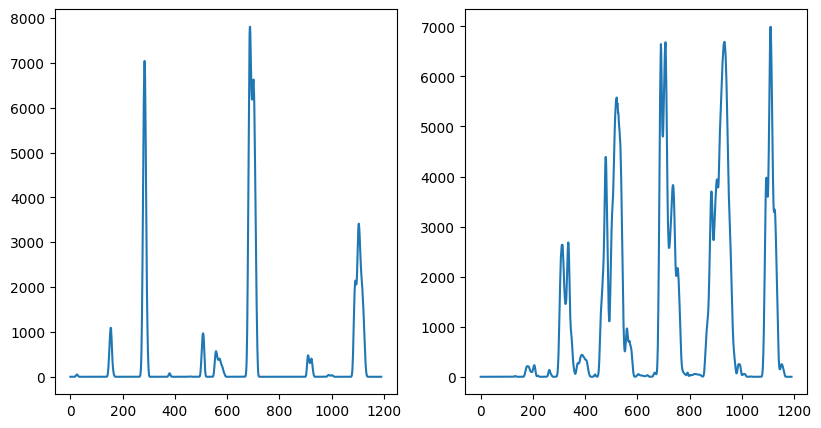

In [8]:
# Let's assume we want to correlate the first and second signals in the list
signal1 = col_sum_filtered_list[0]
signal2 = col_sum_filtered_list[1]
signal7 = col_sum_filtered_list[6]

# Compute the convolution
convolution12 = np.convolve(signal1, signal2, mode='full')
convolution17 = np.convolve(signal1, signal7, mode='full')

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.plot(convolution12)
plt.subplot(1,3,2)
plt.plot(convolution17)

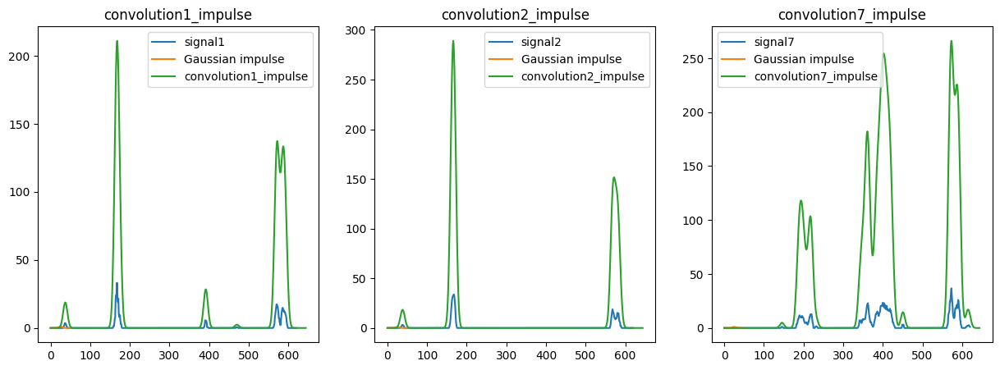

In [17]:
# Convolve signals with an impulse signal
# Define the size of the impulse signal
size = 50
# Define the standard deviation for the Gaussian function
sigma = 5

# Create a Gaussian impulse
x = np.arange(size)
impulse = np.exp(-(x - size/2)**2 / (2 * sigma**2))

# Normalize the impulse to have a maximum value of 1
impulse /= np.max(impulse)

#computing convolutions
convolution1_impulse = np.convolve(signal1, impulse, mode='full')
convolution2_impulse = np.convolve(signal2, impulse, mode='full')
convolution7_impulse = np.convolve(signal7, impulse, mode='full')

plt.figure(figsize=(15,5))

convolution_plots = [convolution1_impulse, convolution2_impulse, convolution7_impulse]
convolution_labels = ['convolution1_impulse', 'convolution2_impulse', 'convolution7_impulse']
signals = [signal1, signal2, signal7]
signal_labels = ['signal1','signal2','signal7']

# plot signals and impulses
for i, convolution_plot in enumerate(convolution_plots):
    plt.subplot(1,3,i+1)
    plt.plot(np.append([0]*25, signals[i]), label=signal_labels[i])
    plt.plot(impulse, label='Gaussian impulse')
    plt.plot(convolution_plot, label=convolution_labels[i])
    plt.title(convolution_labels[i])
    plt.legend()



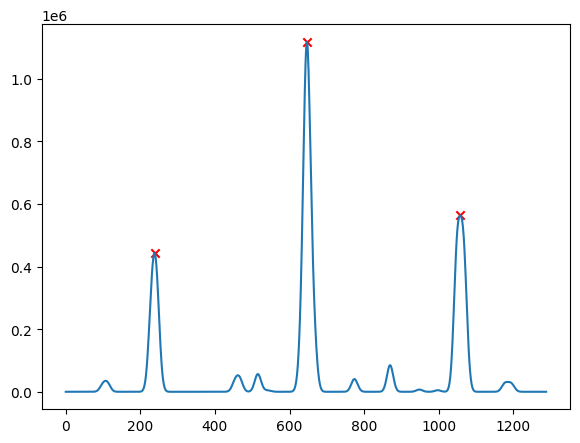

In [ ]:
#correlate convolution1_impulse with convolution2_impulse
convolution1_impulse_convolution2_impulse = np.correlate(convolution1_impulse, convolution2_impulse, mode='full')
peak_locations = funcs.peak_finder(convolution1_impulse_convolution2_impulse, 3)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(convolution1_impulse_convolution2_impulse)
plt.scatter(peak_locations, convolution1_impulse_convolution2_impulse[peak_locations], marker='x', color='red')

Extracting Measures from peaks

In [46]:
peak_locations = np.sort(peak_locations)
c1 = np.abs(peak_locations[0] - peak_locations[1])
c2 = np.abs(peak_locations[1] - peak_locations[2])
a1 = np.sort(funcs.peak_finder(convolution1_impulse, 2))[0]
a2 = np.sort(funcs.peak_finder(convolution2_impulse, 2))[0]
b2 = np.abs(peak_locations[1] - a1 - c1)
b1 = np.abs(len(convolution1_impulse_convolution2_impulse) - a1 -a2 - b2 - c1 - c2)

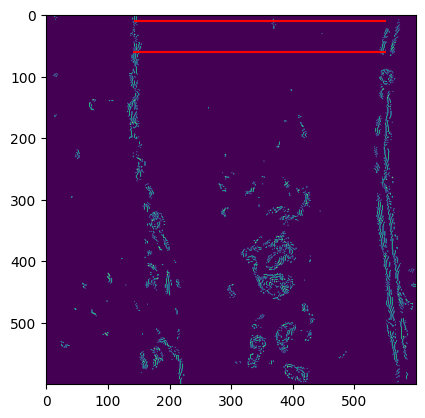

In [ ]:
plt.imshow(im2_canny)
plt.hlines(10, xmin=a1-25, xmax=a1+c1-25, color='red') # we subtract 25 since the impulse signal of 50 shifts our readings by 25
plt.hlines(60, xmin=a2-25, xmax=a2+c2-25, color='red')

In [48]:
print('a1:', a1, 'a2:', a2, 'b1:', b1, 'b2:', b2, 'c1:', c1, 'c2:', c2)
print('a1+b1+c1 = ', a1+b1+c1, 'a2+b2+c2 = ', a2+b2+c2)
len(convolution2_impulse)

a1: 168 a2: 166 b1: 65 b2: 70 c1: 409 c2: 411
a1+b1+c1 =  642 a2+b2+c2 =  647


645

### Doing this in a systematic way

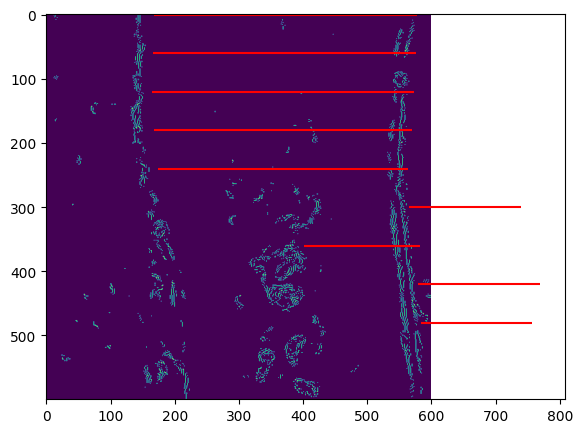

In [54]:
# create a gaussian impulse
size = 50
sigma = 5
x = np.arange(size)
impulse = np.exp(-(x - size/2)**2 / (2 * sigma**2))
impulse /= np.max(impulse)

a_list = []
#b_list = []
c_list = []

plt.figure(figsize=(15,5))
plt.imshow(im2_canny)

for i, val in enumerate(row_starts[:-1]):
    convolution_i_impulse = np.convolve(col_sum_filtered_list[i], impulse, mode='full')
    convolution_j_impulse = np.convolve(col_sum_filtered_list[i+1], impulse, mode='full')
    convolution_i_impulse_convolution_j_impulse = np.correlate(convolution_i_impulse, convolution_j_impulse, mode='full')
    peak_locations = funcs.peak_finder(convolution_i_impulse_convolution_j_impulse, 3)
    peak_locations = np.sort(peak_locations)

    a1 = np.sort(funcs.peak_finder(convolution_i_impulse, 2))[0]
    c1 = np.abs(peak_locations[0] - peak_locations[1])
    a_list.append(a1)
    c_list.append(c1)

    plt.hlines(val, xmin=a1, xmax=a1+c1, color='red')


    

In [53]:
a_list

[168, 166, 165, 167, 174, 565, 402, 579, 584]

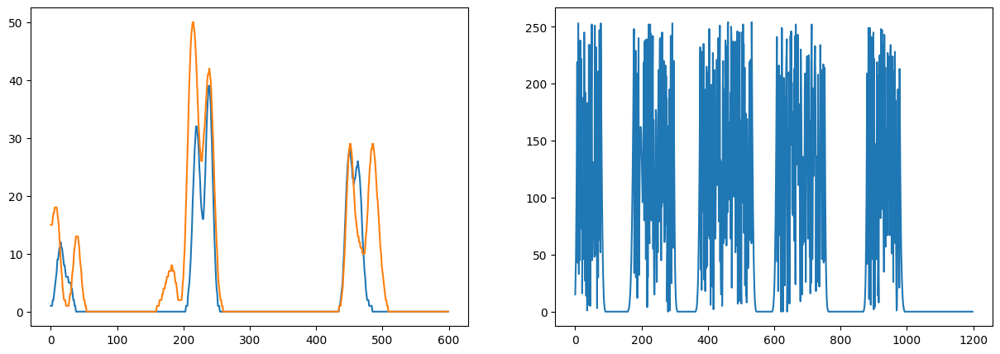

In [25]:
foo1 = cv.GaussianBlur(im1_canny, (51,51), 5)
foo2 = np.convolve(foo1[0], foo1[60], mode='full')
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(foo1[0])
plt.plot(foo1[60])
plt.subplot(1,2,2)
plt.plot(foo2)

In [26]:
peak_locations = np.argsort(convolution1_impulse_convolution2_impulse)[-3:]
print("Peak locations:", peak_locations)

Peak locations: [742 744 743]


### Generalizing this function

In [46]:
# This function findes edges through relative convolutions from one set of lines to another
def find_edges_relconv(cannified_image, rows_per_line=50):
    
    image = cannified_image
    #image = image[250:850, 420:1020]

    n_rows = image.shape[0]
    row_width = rows_per_line

    row_starts = np.arange(0, n_rows, row_width)
    # check if any non-existant rows are present
    if (row_starts[-1] + row_width) > n_rows:
        row_starts = row_starts[:-1]
    #col_sum_list = []
    col_sum_filtered_list = []

    for row_start in row_starts:
        rows = image[row_start: row_start+row_width] # select rows
        col_sum = rows.sum(axis=0)/100
        #col_sum_list.append(col_sum)

        window_size = 5 # Define the window size for the SMA filter 
        # Apply the SMA filter to row_starts
        col_sum_filtered = np.convolve(col_sum, np.ones(window_size), 'valid') / window_size  
        col_sum_filtered_list.append(col_sum_filtered)
    
    # create a gaussian impulse
    size = 50
    sigma = 5
    x = np.arange(size)
    impulse = np.exp(-(x - size/2)**2 / (2 * sigma**2))
    impulse /= np.max(impulse) #scaling

    a_list = []
    c_list = []
    r_list = [] # the current row

    for i, val in enumerate(row_starts[:-1]):
        #first we convolve with impulses to find peaks
        convolution_i_impulse = np.convolve(col_sum_filtered_list[i], impulse, mode='full')
        convolution_j_impulse = np.convolve(col_sum_filtered_list[i+1], impulse, mode='full')
        #then we convolve with one another to find correlation
        convolution_i_impulse_convolution_j_impulse = np.correlate(convolution_i_impulse, convolution_j_impulse, mode='full')

        peak_locations = funcs.peak_finder(convolution_i_impulse_convolution_j_impulse, 3)
        peak_locations = np.sort(peak_locations)

        if peak_locations.shape[0] != 3:
            continue # skip this loop if the peak_locations are not convolving properly

        if len(funcs.peak_finder(convolution_i_impulse, 2)) < 2:
            continue # skip this loop if there are less than 2 peal locations in the convolution

        a1 = np.sort(funcs.peak_finder(convolution_i_impulse, 2))[0]
        c1 = np.abs(peak_locations[0] - peak_locations[1])
        this_row = val

        a_list.append(a1)
        c_list.append(c1)
        r_list.append(this_row)

    return np.array(a_list), np.array(c_list), np.array(r_list)

In [47]:
a, c, rs = find_edges_relconv(im1_canny, 20)
print('a_list: ', a, ' // len: ', len(a))
print('c_list: ', c, ' // len: ', len(c))
print('row_starts: ', rs, ' // len: ', len(rs))


a_list:  [243 248 244 237 200 221 474 246 227 277 479 274  69  73 475  50 462 252
 254 456  38 457 467 473 467 254 255 261 263]  // len:  29
c_list:  [232 252 237  47  44  32  60 231 218 260 246  40 204 207 213  26 222 208
 209 214  41  33  43  91 215 205  76 254  41]  // len:  29
row_starts:  [  0  20  40  60  80 100 120 140 160 180 200 220 240 260 280 300 320 340
 360 380 400 420 440 460 480 500 520 540 560]  // len:  29


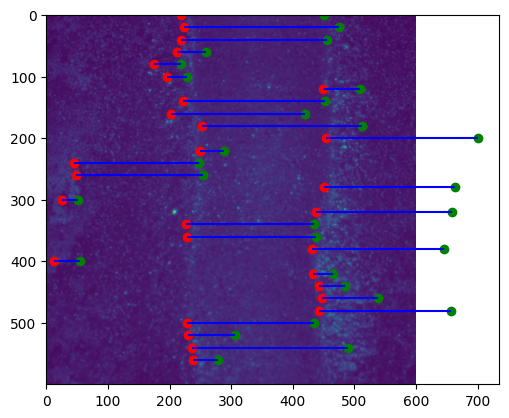

In [48]:
plt.imshow(roi1)
shift=25
plt.scatter(a-shift, rs, color='red')
plt.scatter(a+c-shift, rs, color='green')
plt.hlines(rs, a-shift, a+c-shift, color='blue')

Changing the function to make it applicable to full sized images

## Applying this to OpenCV's video function

In [51]:

vid = cv.VideoCapture('Vids/VID_topview.webm')
fourcc = cv.VideoWriter_fourcc(*'MP4V')
out = cv.VideoWriter('output.mp4', fourcc, 30.0, (int(vid.get(3)), int(vid.get(4))), isColor=False)
this_frame=0
if (vid.isOpened() == False):
    print("Error opening video stream or file")

while (vid.isOpened()):
    (ret, frame) = vid.read()
    if ret == True:
        roi = frame[250:850, 420:1020]
        # applying transformations
        roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)
        edge = cv_Canny(roi, 6, 33, 7, 7)
        this_frame += 1
        print('Frame: ', this_frame)
        #finding points of the line
        a, c, rs = find_edges_relconv(edge, rows_per_line=200)
        x1y = list(zip(a+420, rs+250)) # adding the removed dims for the ROI
        x2y = list(zip(a+c+420, rs+250))

        #drawing lines
        for i in range(len(x1y)):
            cv.line(frame, pt1 = x1y[i], pt2 = x2y[i], color=(0,255,0))

        out.write(edge)
        cv.imshow('Edge Detection', frame)

    else:
        break


    if cv.waitKey(25) & 0xFF == ord('q'):
        break


vid.release()
out.release()

cv.waitKey(1)
cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


Frame:  1
Frame:  2
Frame:  3
Frame:  4
Frame:  5
Frame:  6
Frame:  7
Frame:  8
Frame:  9
Frame:  10
Frame:  11
Frame:  12
Frame:  13
Frame:  14
Frame:  15
Frame:  16
Frame:  17
Frame:  18
Frame:  19
Frame:  20
Frame:  21
Frame:  22
Frame:  23
Frame:  24
Frame:  25
Frame:  26
Frame:  27
Frame:  28
Frame:  29
Frame:  30
Frame:  31
Frame:  32
Frame:  33
Frame:  34
Frame:  35
Frame:  36
Frame:  37
Frame:  38
Frame:  39
Frame:  40
Frame:  41
Frame:  42
Frame:  43
Frame:  44
Frame:  45
Frame:  46
Frame:  47
Frame:  48
Frame:  49
Frame:  50
Frame:  51
Frame:  52
Frame:  53
Frame:  54
Frame:  55
Frame:  56
Frame:  57
Frame:  58
Frame:  59
Frame:  60
Frame:  61
Frame:  62
Frame:  63
Frame:  64
Frame:  65
Frame:  66
Frame:  67
Frame:  68
Frame:  69
Frame:  70
Frame:  71
Frame:  72
Frame:  73
Frame:  74
Frame:  75
Frame:  76
Frame:  77
Frame:  78
Frame:  79
Frame:  80
Frame:  81
Frame:  82
Frame:  83
Frame:  84
Frame:  85
Frame:  86
Frame:  87
Frame:  88
Frame:  89
Frame:  90
Frame:  91
Frame:  

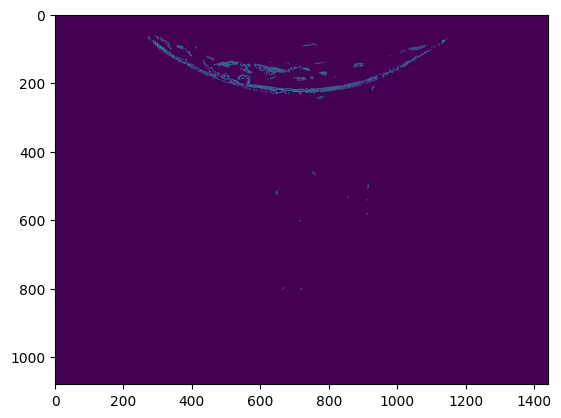

In [211]:
plt.imshow(edge)

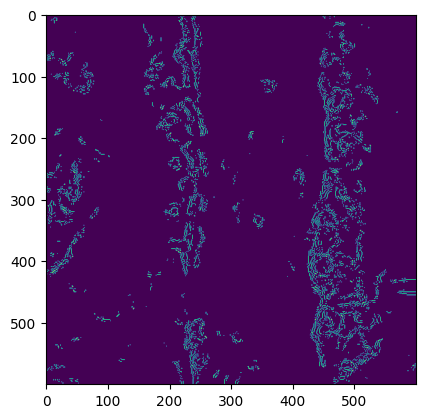

In [149]:
plt.imshow(find_lines(im1_canny))


## Analysing untouched images

(-0.5, 599.5, 599.5, -0.5)

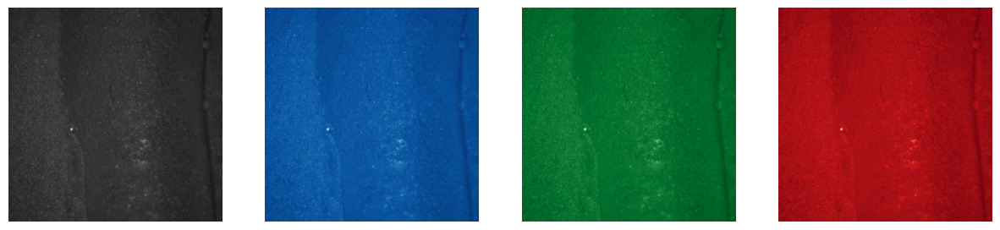

In [129]:
plt.figure(figsize=(15,10))
im2_bgr = cv.imread('Images/Inputs/topview/VID_topview-0002.png')
plt.subplot(1,4,1)
plt.imshow(im2_bgr[250:850, 420:1020])
plt.axis('off')
plt.subplot(1,4,2)
plt.imshow(im2_bgr[250:850, 420:1020, 0], cmap='Blues_r')
plt.axis('off')
plt.subplot(1,4,3)
plt.imshow(im2_bgr[250:850, 420:1020, 1], cmap='Greens_r')
plt.axis('off')
plt.subplot(1,4,4)
plt.imshow(im2_bgr[250:850, 420:1020, 2], cmap='Reds_r')
plt.axis('off')

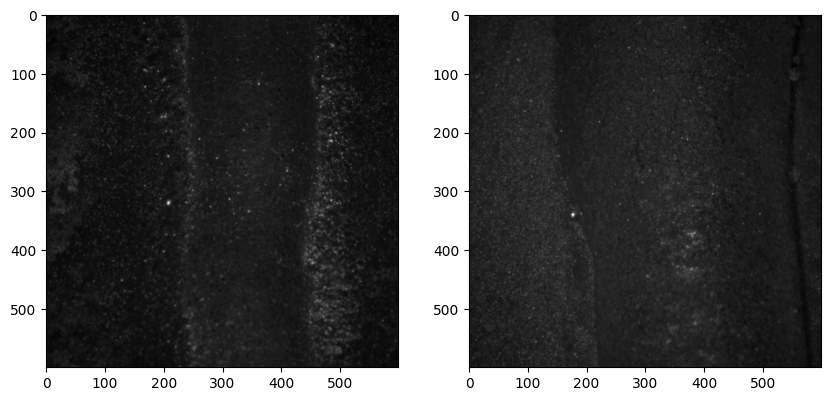

In [99]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(roi1_norm, cmap='grey')

plt.subplot(1,2,2)
plt.imshow(roi2, cmap='grey')

Hpw can we chose what an appropriate range to search for an edge is? Well, we assume that on average the edge is where there is a sharp gradient between the colors

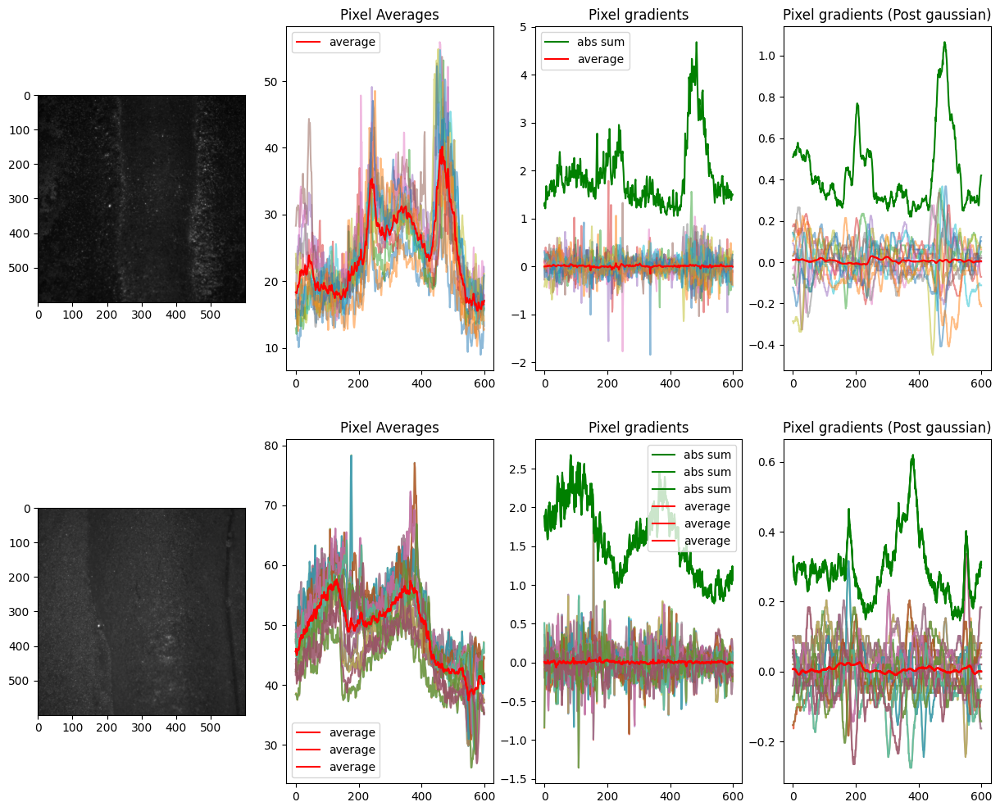

In [130]:
plt.figure(figsize=(15,12))
num = 1
for j, image in enumerate([roi1_norm,im2_bgr[250:850, 420:1020] ]):

    plt.subplot(2, 4, num)
    plt.imshow(image, cmap='grey')
    num += 1

    plt.subplot(2, 4, num)
    for i in range(0,600,50):
        plt.plot(np.average(image[i:i+49, :], axis=0), alpha=0.5)

    plt.plot(np.average(image, axis=0), color='red', label='average')
    plt.legend()
    plt.title('Pixel Averages')
    num += 1

    plt.subplot(2, 4, num)
    gradient_rows = np.gradient(image)[0]
    for i in range(0,600,50):
        plt.plot(np.average(gradient_rows[i:i+49], axis=0), alpha=0.5)

    plt.plot(np.sum(np.abs(gradient_rows)/700, axis=0), color='green', label='abs sum')
    plt.plot(np.average(gradient_rows, axis=0), color='red', label='average')
    plt.legend()
    plt.title('Pixel gradients')
    num += 1

    plt.subplot(2, 4, num)
    roi1_norm_blur = cv.GaussianBlur(image, (21,21), 5)
    gradient_rows = np.gradient(roi1_norm_blur)[0]
    for i in range(0,600,50):
        plt.plot(np.average(gradient_rows[i:i+49], axis=0), alpha=0.5)

    plt.plot(np.sum(np.abs(gradient_rows)/350, axis=0), color='green')
    plt.plot(np.average(gradient_rows, axis=0), color='red')
    plt.title('Pixel gradients (Post gaussian)')
    num += 1



0
finish
1
finish


### Applying Hough Transform to Images

In [11]:
cdstP = np.copy(im1_canny)
linesP = cv.HoughLinesP(im1_canny, 1, np.pi/180, 0, None, 0, 10)

# Draw the lines
if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv.LINE_AA)

cv.imshow("Source", im1_canny)
cv.imshow("Detected Lines (in red) - Probabilistic Line Transform", cdstP)

cv.waitKey()
cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)


### Other

Choosing a particular row to analyse

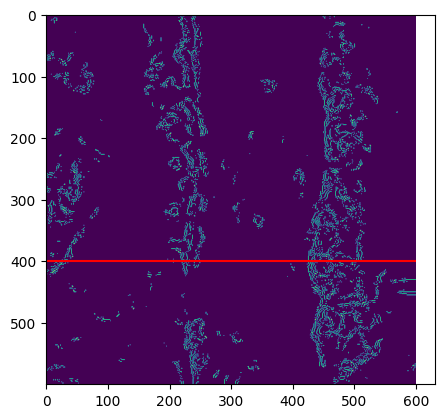

In [13]:
selected_row = 400
plt.imshow(im1_canny)
plt.hlines(selected_row, xmin=0, xmax = im1_canny.shape[0], color='red')

In [88]:
roi2_norm_canny[400].size == roi2_norm_canny.shape[0]

False

In [12]:

import random as rng
rng.seed(12345)
def thresh_callback(val):
    threshold = val
    # Detect edges using Canny
    canny_output = cv.Canny(src_gray, threshold, threshold * 2)
    # Find contours
    contours, hierarchy = cv.findContours(canny_output, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    # Draw contours
    drawing = np.zeros((canny_output.shape[0], canny_output.shape[1], 3), dtype=np.uint8)
    for i in range(len(contours)):
        color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
        cv.drawContours(drawing, contours, i, color, 2, cv.LINE_8, hierarchy, 0)
    # Show in a window
    cv.imshow('Contours', drawing)

# Convert image to gray and blur it
src_gray = roi1_norm
src_gray = cv.GaussianBlur(src_gray, (33, 33), 6)
# Create Window
source_window = 'Source'
cv.namedWindow(source_window)
cv.imshow(source_window, roi1_norm)
max_thresh = 255
thresh = 100 # initial threshold
cv.createTrackbar('Canny Thresh:', source_window, thresh, max_thresh, thresh_callback)
thresh_callback(thresh)
cv.waitKey()
cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

(array([  4.,  14.,  21.,  84., 325.,  88.,  39.,  15.,   8.,   2.]),
 array([-35.5, -27.9, -20.3, -12.7,  -5.1,   2.5,  10.1,  17.7,  25.3,
         32.9,  40.5]),
 <BarContainer object of 10 artists>)

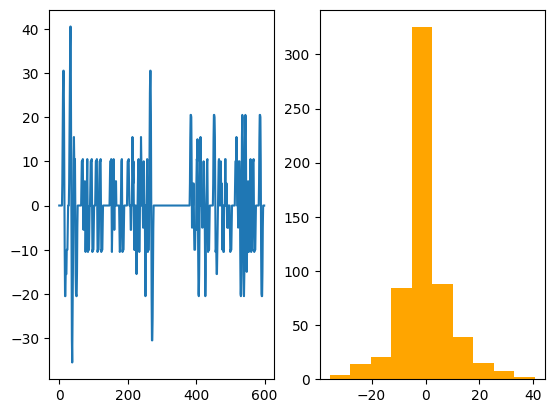

In [48]:
fig, ax = plt.subplots(1,2)

ax[0].plot(np.gradient(smooth2, 1))
ax[1].hist(np.gradient(smooth2, 1), color='orange')

In [7]:
test_image = roi2_norm_diff # feed only grayscale images!
window_name = 'Canny Tester'
trackbar_sigma = 'Sigma'
max_sigma = 100
trackbar_kernel = ' Kernel Size'
max_kernel = 201
trackbar_lo_thresh = 'Low'
trackbar_hi_thresh = 'High'
max_value = 255
trackbar_thresh = 'Thresh'

def Canny_Demo(val):

    sigma = cv.getTrackbarPos(trackbar_sigma, window_name)
    kernel = cv.getTrackbarPos(trackbar_kernel, window_name)
    kernel = (int(kernel/2)*2)+1 # ensures kernel is always odd
    lo = cv.getTrackbarPos(trackbar_lo_thresh, window_name)
    hi = cv.getTrackbarPos(trackbar_hi_thresh, window_name)
    thresh_val = cv.getTrackbarPos(trackbar_thresh, window_name)
    _, thresh = cv.threshold(test_image, thresh_val, 255, cv.THRESH_TOZERO)
    blur = cv.GaussianBlur(thresh, (kernel, kernel), sigma)
    canny = cv.Canny(blur, lo, hi)
    cv.imshow(window_name, canny)

cv.namedWindow(window_name)

cv.createTrackbar(trackbar_sigma, window_name, 6, max_sigma, Canny_Demo )
cv.createTrackbar(trackbar_kernel, window_name , 33, max_kernel, Canny_Demo)
cv.createTrackbar(trackbar_lo_thresh, window_name , 7, max_value, Canny_Demo)
cv.createTrackbar(trackbar_hi_thresh, window_name , 7, max_value, Canny_Demo)
cv.createTrackbar(trackbar_thresh, window_name , 40, max_value, Canny_Demo)

# Call the function to initialize
Canny_Demo(0)
# Wait until user finishes program
cv.waitKey()

cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

NameError: name 'roi2_norm_diff' is not defined

## 